# НИРС

## Поиск и выбор набора данных для построения моделей машинного обучения. На основе выбранного набора данных студент должен построить модели машинного обучения для решения или задачи классификации, или задачи регрессии.

В качестве набора данных будет использоваться набор данных со статистикой всех популярных песен в стриминговом сервисе `Spotify`:  
https://www.kaggle.com/datasets/asaniczka/top-spotify-songs-in-73-countries-daily-updated  
Датасет состоит из одного файла:
- universal_top_spotify_songs.csv
В файле есть следующие колонки:
- spotify_id - ID песни в `Spotify` (в анализе использоваться не будет)
- name - название песни
- artists - имена музыкантов-авторов песни, разделены через запятую
- snapshot_date - дата загрузки информации о песне в датасет (служебное поле, использоваться в анализе не будет)
- daily_rank - служебное поле которое не используется в работе
- daily_movement - то же
- weekly_movement - то же
- country - страна, в которой песня обрела наибольшую популярность
- popularity - популярность песни в `Spotify` (метрика от 0 до 100)
- is_explicit - есть ли в песне нецензурное содержание
- duration_ms - длительность песни в миллисекундах
- album_name - название альбома, на котором была выпущена песня
- album_release_date - дата релиза альбома с песней
- danceability - метрика танцевальности песни от 0 до 1
- energy - метрика энергичности песни от 0 до 1
- key - тональность песни (закодированный категориальный признак)
- loudness - средняя громкость песни в децибелах
- mode - мажрная или минорная тональность у песни
- speechiness - метрика количества произнесённых в песне слов от 0 до 1
- acousticness - метрика акустического качества песни от 0 до 1
- instrumentalness - метрика количества инструментала в песне от 0 до 1
- liveness - метрика присутствия аудитории в момент записи песни от 0 до 1
- valence - метрика позитивности песни от 0 до 1
- tempo - темп песни в ударах в минуту
- time_signature - тактовый размер песни (3/4 или 4/4)
В данной работе будет решаться задача **регрессии**. В качестве целевого признака будем использовать поле `popularity`.


## Импорт библиотек

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Загрузка данных

In [2]:
df = pd.read_csv('universal_top_spotify_songs.csv')

## Проведение разведочного анализа данных. Построение графиков, необходимых для понимания структуры данных. Анализ и заполнение пропусков в данных

In [3]:
df.head()

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,7fzHQizxTqy8wTXwlrgPQQ,MILLION DOLLAR BABY,Tommy Richman,1,0,0,NaN,2024-05-20,98,False,...,1,-5.106,0,0.0436,0.09820,0.000215,0.0680,0.927,138.003,4
1,2qSkIjg1o9h3YT9RAgYN75,Espresso,Sabrina Carpenter,2,1,1,NaN,2024-05-20,99,True,...,0,-5.478,1,0.0285,0.10700,0.000065,0.1850,0.690,103.969,4
2,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,Kendrick Lamar,3,-1,-1,NaN,2024-05-20,97,True,...,1,-7.001,1,0.0776,0.01070,0.000000,0.1410,0.214,101.061,4
3,629DixmZGHc7ILtEntuiWE,LUNCH,Billie Eilish,4,0,46,NaN,2024-05-20,86,False,...,11,-7.981,0,0.0643,0.04520,0.082300,0.0632,0.945,124.987,4
4,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),"Post Malone, Morgan Wallen",5,0,-1,NaN,2024-05-20,94,True,...,7,-4.860,1,0.0264,0.00757,0.000000,0.2450,0.731,127.986,4


In [4]:
df.shape

(774353, 25)

In [5]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

In [6]:
df.dtypes

spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object

Удаление дупликатов

In [7]:
df = df.drop_duplicates()

Проверка наличия нулевых значений

In [8]:
df.isnull().sum()

spotify_id                0
name                     27
artists                  27
daily_rank                0
daily_movement            0
weekly_movement           0
country               10457
snapshot_date             0
popularity                0
is_explicit               0
duration_ms               0
album_name              264
album_release_date      264
danceability              0
energy                    0
key                       0
loudness                  0
mode                      0
speechiness               0
acousticness              0
instrumentalness          0
liveness                  0
valence                   0
tempo                     0
time_signature            0
dtype: int64

Согласно описанию датасета, поле `country` равняется `Null`, если песня попала в плейлист `Global Top 50`.
Поэтому, для использования датасета, заменим пустые значения в колонке `country` на строку `"Global"`

In [9]:
df['country'] = df['country'].fillna("Global")
df.isnull().sum()

spotify_id              0
name                   27
artists                27
daily_rank              0
daily_movement          0
weekly_movement         0
country                 0
snapshot_date           0
popularity              0
is_explicit             0
duration_ms             0
album_name            264
album_release_date    264
danceability            0
energy                  0
key                     0
loudness                0
mode                    0
speechiness             0
acousticness            0
instrumentalness        0
liveness                0
valence                 0
tempo                   0
time_signature          0
dtype: int64

Остальные строки с пропусками удалим.  
Это мотивированно тем, что пропуски имеются в не числовых колонках, которые заменять на самое часто встречающееся значение было бы некорректно.

In [10]:
df = df.dropna()
df.isnull().sum()

spotify_id            0
name                  0
artists               0
daily_rank            0
daily_movement        0
weekly_movement       0
country               0
snapshot_date         0
popularity            0
is_explicit           0
duration_ms           0
album_name            0
album_release_date    0
danceability          0
energy                0
key                   0
loudness              0
mode                  0
speechiness           0
acousticness          0
instrumentalness      0
liveness              0
valence               0
tempo                 0
time_signature        0
dtype: int64

Так как датасет очень большой (более 700000 строк), сократим его до 5000 строк:

In [11]:
df = df.sample(n=5000, random_state=73)

Снова смотрим состав датасета:

In [12]:
df.head()

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
54148,4BXG52ul7GlV4Qpve6JDJo,Señal De Vida,Ñejo & Dalmata,49,1,1,CO,2024-05-06,69,False,...,9,-7.091,1,0.0846,0.09730,0.000293,0.580,0.713,171.968,4
190575,7Ho0Xbf3vHdBJiTbQocuxQ,A PURO DOLOR,"Emanero, Rusherking, Angel Lopez",37,-3,0,UY,2024-03-27,70,False,...,0,-5.325,1,0.0368,0.44200,0.000000,0.141,0.539,156.011,4
582952,4qlMFQs9oEp5bVxERhTZBU,На заре,Basta,33,-2,17,LV,2023-12-09,63,False,...,11,-11.744,0,0.0290,0.00769,0.057300,0.392,0.238,127.017,4
600498,1A6tib5hSqCJAMSBRkNV55,UH LA LA LA,"LON3R JOHNY, Plutonio",29,1,6,PT,2023-12-04,61,True,...,0,-7.655,1,0.1530,0.10400,0.192000,0.382,0.547,119.979,4
179973,31nfdEooLEq7dn3UMcIeB5,Vois sur ton chemin - Techno Mix,BENNETT,35,-11,-8,SK,2024-03-30,87,False,...,2,-3.394,0,0.0470,0.09080,0.071100,0.119,0.371,137.959,4


In [13]:
df.shape

(5000, 25)

In [14]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

In [15]:
df.dtypes

spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object

**Вывод**: удалили лишние колонки из датасета, очистили его от дупликатов и пустых значений.

## Построение графиков для понимания структуры данных

In [16]:
cat_cols = ['is_explicit', 'key', 'mode', 'time_signature'] # категориальные колонки, закодированные в самом датасете

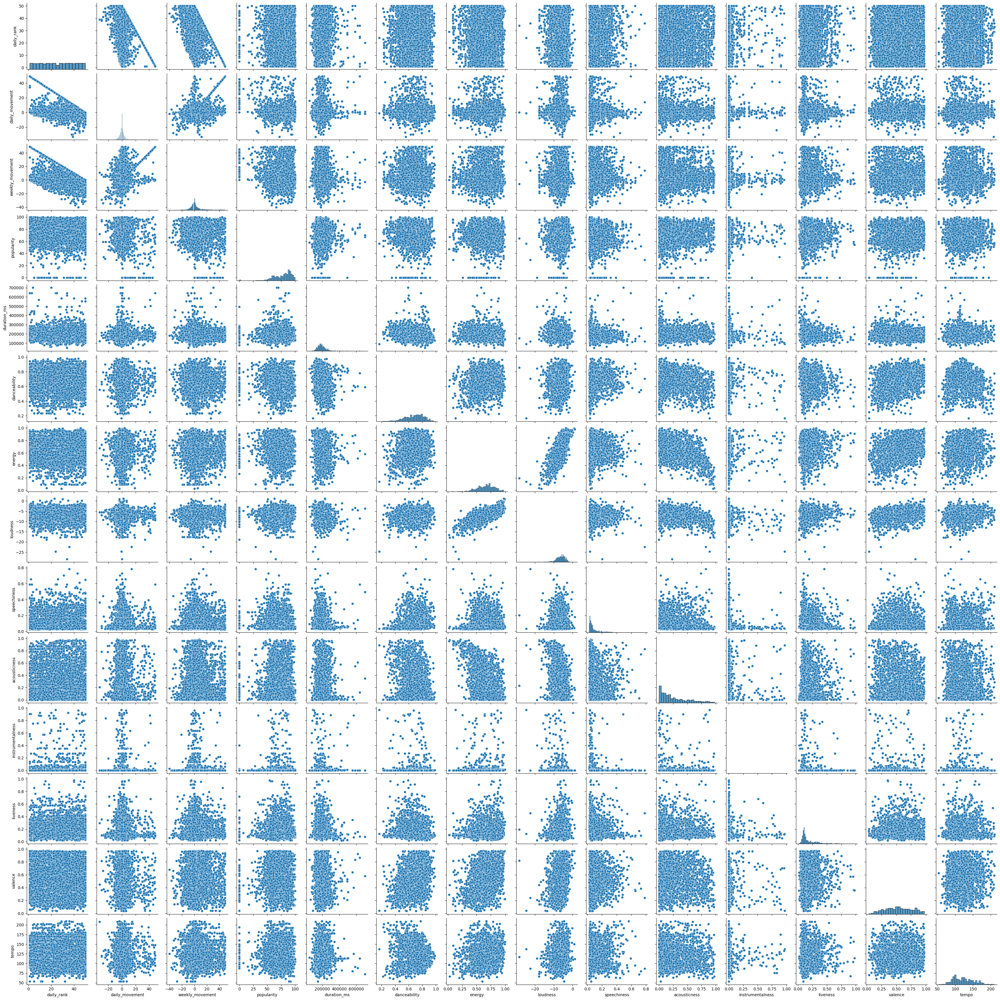

In [17]:
sns.pairplot(df.drop(columns=cat_cols))

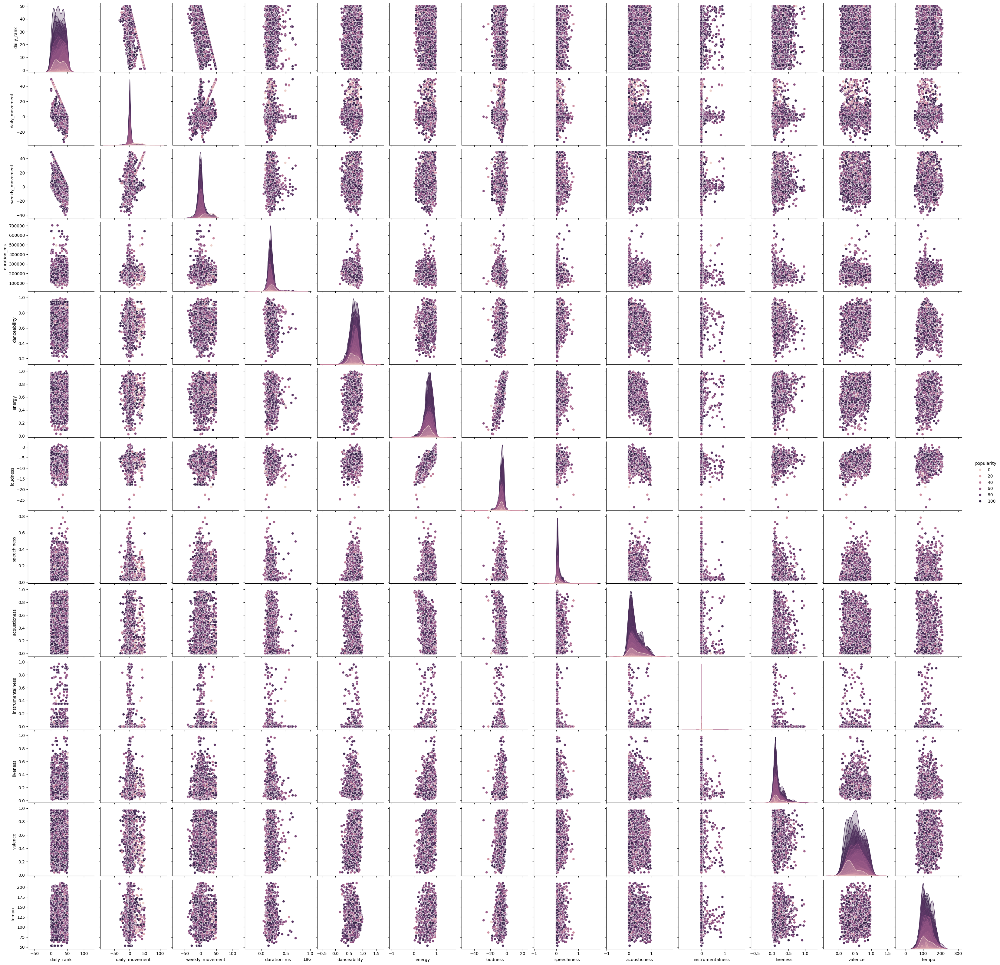

In [18]:
sns.pairplot(df.drop(columns=cat_cols), hue='popularity')

In [19]:
df.columns

Index(['spotify_id', 'name', 'artists', 'daily_rank', 'daily_movement',
       'weekly_movement', 'country', 'snapshot_date', 'popularity',
       'is_explicit', 'duration_ms', 'album_name', 'album_release_date',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature'],
      dtype='object')

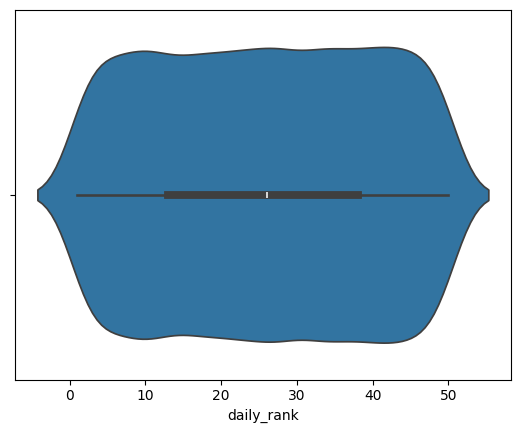

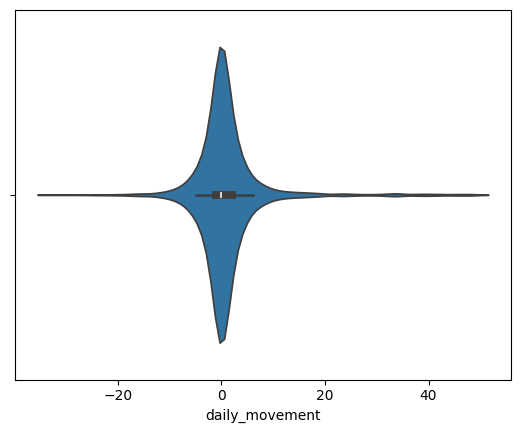

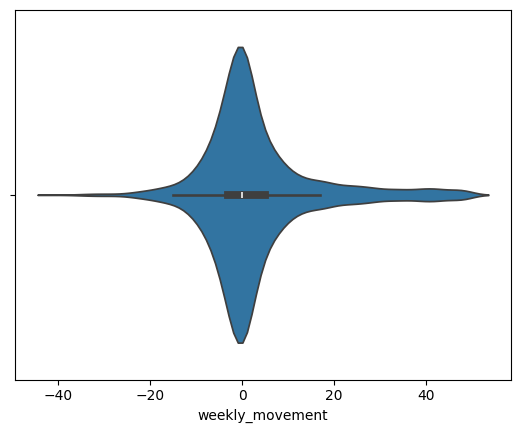

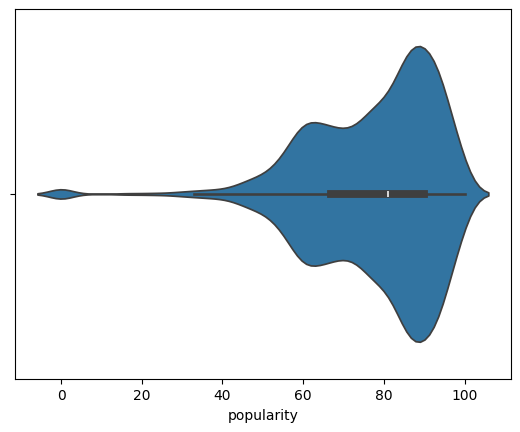

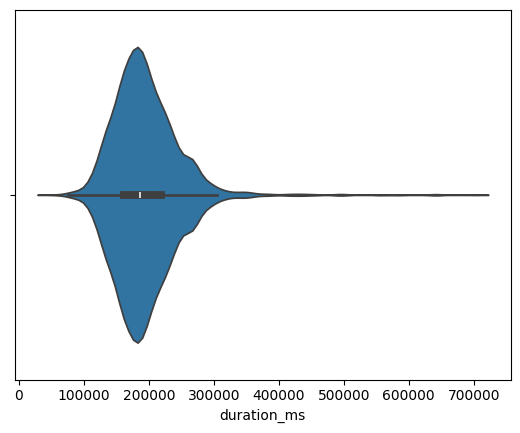

...

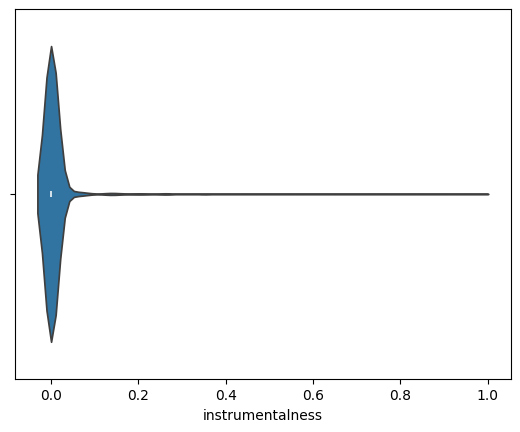

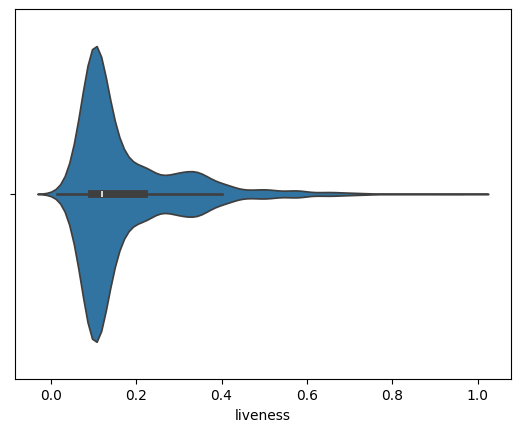

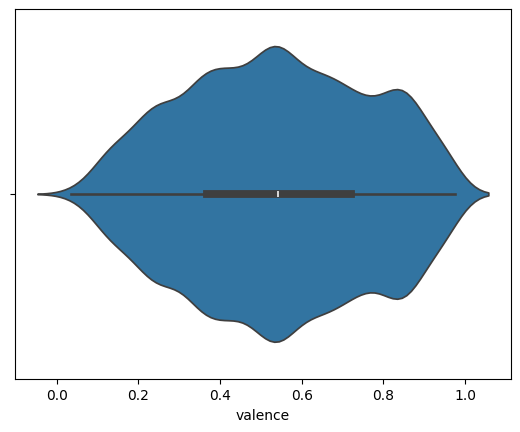

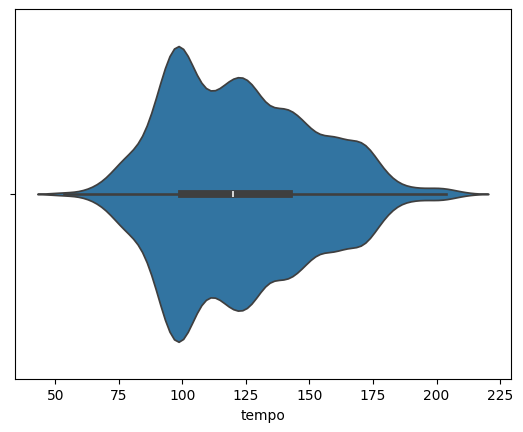

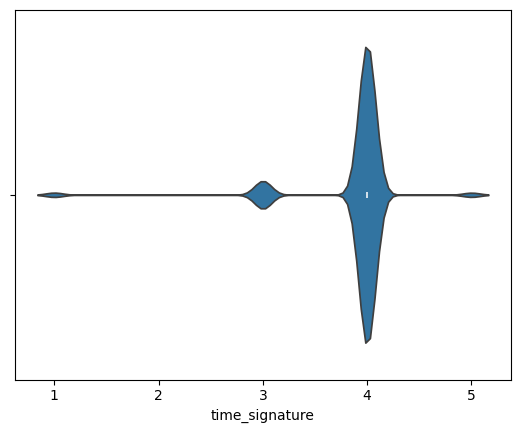

In [20]:
for col in df.columns:
    if str(df[col].dtype) not in ['int64', 'float64']:
        continue
    sns.violinplot(x=df[col])
    plt.show()

## Выбор признаков, подходящих для построения моделей. Кодирование категориальных признаков. Масштабирование данных. Формирование вспомогательных признаков, улучшающих качество моделей.

In [21]:
df.dtypes

spotify_id             object
name                   object
artists                object
daily_rank              int64
daily_movement          int64
weekly_movement         int64
country                object
snapshot_date          object
popularity              int64
is_explicit              bool
duration_ms             int64
album_name             object
album_release_date     object
danceability          float64
energy                float64
key                     int64
loudness              float64
mode                    int64
speechiness           float64
acousticness          float64
instrumentalness      float64
liveness              float64
valence               float64
tempo                 float64
time_signature          int64
dtype: object

Удалим из датасета неиспользуемые служебные колонки (`daily_rank`, `daily_movement`, ...).

In [22]:
df = df.drop(columns=['daily_rank', 'daily_movement', 'weekly_movement', 'snapshot_date', 'spotify_id'])

Так же в анализе не будут использоваться такие поля, как `album_name`, `artists` и `name` - так как эти признаки служат для идентифкации отдельных песен, но не представляют ценности именно для анализа данных.
Поле `album_release_date` тоже не будет использоваться, так как мы не рассматриваем датасет как временной ряд. 

In [23]:
df = df.drop(columns=['album_name', 'artists', 'name', 'album_release_date'])

В датасете есть несколько категориальных признаков, но в большинстве своём они уже закодированны.  
Исключением является только колонка `country`, исправим это.

In [24]:
from sklearn.preprocessing import LabelEncoder

country_label_encoder = LabelEncoder()

df['country'] = country_label_encoder.fit_transform(df['country'])

df.head()

,country,popularity,is_explicit,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
54148,12,69,False,240255,0.722,0.680,9,-7.091,1,0.0846,0.09730,0.000293,0.580,0.713,171.968,4
190575,69,70,False,206153,0.593,0.711,0,-5.325,1,0.0368,0.44200,0.000000,0.141,0.539,156.011,4
582952,42,63,False,306415,0.653,0.605,11,-11.744,0,0.0290,0.00769,0.057300,0.392,0.238,127.017,4
600498,56,61,True,180300,0.855,0.551,0,-7.655,1,0.1530,0.10400,0.192000,0.382,0.547,119.979,4
179973,62,87,False,178156,0.634,0.824,2,-3.394,0,0.0470,0.09080,0.071100,0.119,0.371,137.959,4


Проведём масштабирование данных

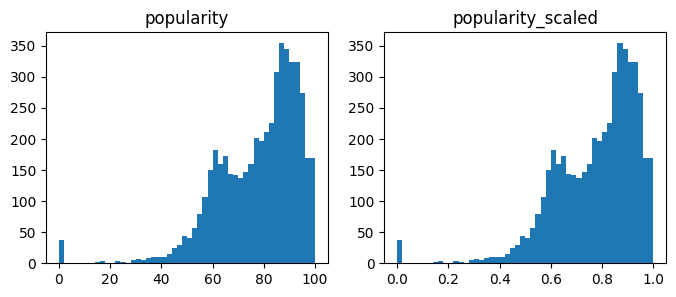

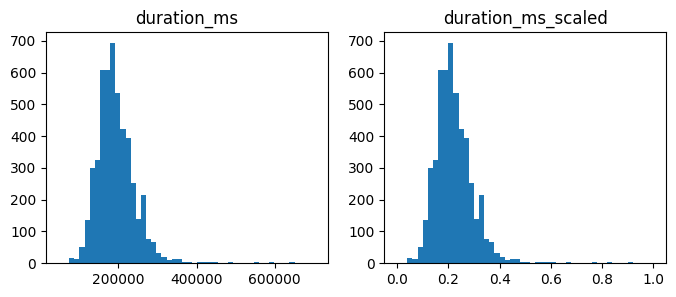

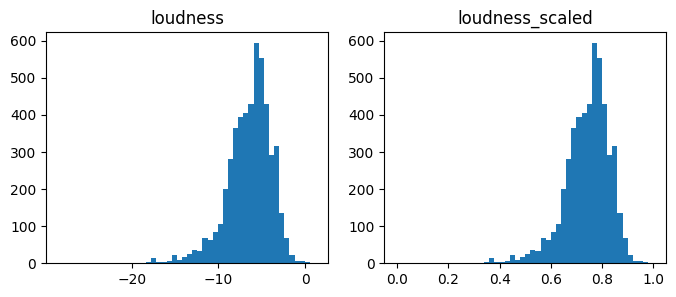

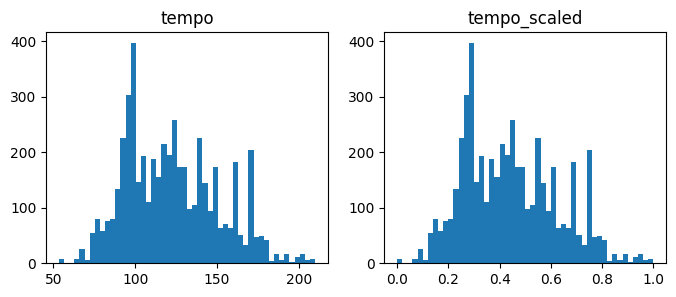

In [25]:
from sklearn.preprocessing import MinMaxScaler

df_scaler = MinMaxScaler()

cols_to_scale = ['popularity', 'duration_ms', 'loudness', 'tempo']

for col in cols_to_scale:
    if str(df[col].dtype) not in ['int64', 'float64']:
        continue

    fig, ax = plt.subplots(1, 2, figsize=(8,3))
    ax[0].hist(df[col], 50)
    ax[0].title.set_text(col)
    
    df[[col]] = df_scaler.fit_transform(df[[col]])
    
    ax[1].hist(df[col], 50)
    ax[1].title.set_text(col + '_scaled')
    plt.show()


In [26]:
df.head()

,country,popularity,is_explicit,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
54148,12,0.69,False,0.293449,0.722,0.680,9,0.721165,1,0.0846,0.09730,0.000293,0.580,0.713,0.757457,4
190575,69,0.70,False,0.241397,0.593,0.711,0,0.780881,1,0.0368,0.44200,0.000000,0.141,0.539,0.655538,4
582952,42,0.63,False,0.394432,0.653,0.605,11,0.563825,0,0.0290,0.00769,0.057300,0.392,0.238,0.470351,4
600498,56,0.61,True,0.201936,0.855,0.551,0,0.702093,1,0.1530,0.10400,0.192000,0.382,0.547,0.425399,4
179973,62,0.87,False,0.198664,0.634,0.824,2,0.846177,0,0.0470,0.09080,0.071100,0.119,0.371,0.540239,4


## Проведение корреляционного анализа данных. Формирование промежуточных выводов о возможности построения моделей машинного обучения.

In [27]:
corr_cols = list(df.columns)
corr_cols.remove('is_explicit')
corr_cols

['country',
 'popularity',
 'duration_ms',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature']

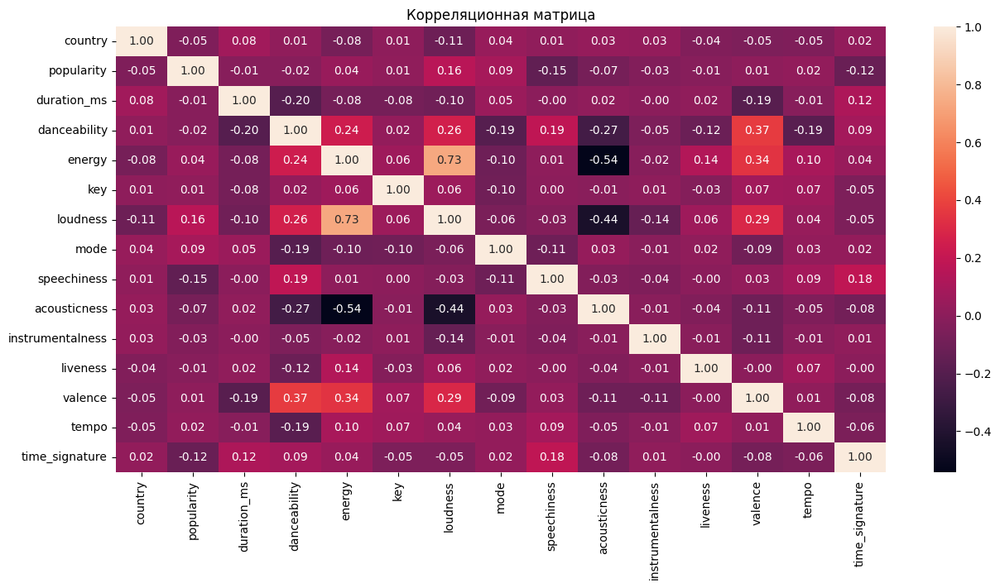

In [28]:
fig, ax = plt.subplots(figsize=(15,7))
sns.heatmap(df[corr_cols].corr(), annot=True, fmt='.2f')
ax.set_title('Корреляционная матрица')
plt.show()

На основе корреляционной матрицы можно сделать следующие выводы:
- мяу
- мяу мяу мяу
- мяу мяу

## Выбор метрик для последующей оценки качества моделей

### В качестве метрик для решения задачи регрессии будем использовать:
Mean absolute error - средняя абсолютная ошибка
$$MAE(y,\hat{y})=\frac{1}{N}\Sigma^{N}_{i=1}|y_i−\hat{y_i}|$$
где:

$$y\text{ - истинное значение целевого признака} $$
$$\hat{y} \text{- предсказанное значение целевого признака}$$
$$N \text{- размер тестовой выборки}$$

Чем ближе значение к нулю, тем лучше качество регрессии.

Основная проблема метрики состоит в том, что она не нормирована.

Вычисляется с помощью функции mean_absolute_error.

Mean squared error - средняя квадратичная ошибка
$$MSE(y,\hat{y})=\frac{1}{N}\Sigma^{N}_{i=1}(y_i−\hat{y_i})2$$
где:

$$y \text{- истинное значение целевого признака}$$
$$\hat{y} \text{- предсказанное значение целевого признака}$$
$$N \text{- размер тестовой выборки}$$
 
Вычисляется с помощью функции mean_squared_error.

Метрика R2
 или коэффициент детерминации
$$R^2(y,\hat{y} )=1− \frac{\Sigma^{N}_{i=1} (y_i - \hat{y_i^2})}{\Sigma^{N}_{i=1} (y_i - \hat{y_i^2})}$$
где:

$$y \text{ - истинное значение целевого признака}$$
$$\hat{y} \text{- предсказанное значение целевого признака}$$
$$N \text{- размер тестовой выборки}$$
$$\overline{y_i}=\frac{1}{N} \cdot \Sigma^{N}_{i=1}y_i$$
Вычисляется с помощью функции r2_score.

In [164]:
import numpy as np

class MetricLogger:
    
    def __init__(self):
        self.df = pd.DataFrame(
            {'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')})

    def add(self, metric, alg, value):
        """
        Добавление значения
        """
        # Удаление значения если оно уже было ранее добавлено
        self.df.drop(self.df[(self.df['metric']==metric)&(self.df['alg']==alg)].index, inplace = True)
        # Добавление нового значения
        temp = pd.DataFrame([{'metric':metric, 'alg':alg, 'value':value}])
        self.df = pd.concat([self.df, temp], ignore_index=True)
    def get_data_for_metric(self, metric, ascending=True):
        """
        Формирование данных с фильтром по метрике
        """
        temp_data = self.df[self.df['metric']==metric]
        temp_data_2 = temp_data.sort_values(by='value', ascending=ascending)
        return temp_data_2['alg'].values, temp_data_2['value'].values
    def plot(self, str_header, metric, ascending=True, figsize=(5, 5)):
        """
        Вывод графика
        """
        array_labels, array_metric = self.get_data_for_metric(metric, ascending)
        fig, ax1 = plt.subplots(figsize=figsize)
        pos = np.arange(len(array_metric))
        metric_max = np.max(array_metric)
        metric_min = np.min(array_metric)
        metric_min_max_diff = metric_max - metric_min
        array_metric_normalized = np.copy(array_metric)
        for i in range(len(array_metric)):
            array_metric_normalized[i] = array_metric[i] * 1000.0
        rects = ax1.barh(pos, array_metric_normalized,
                         align='center',
                         height=0.5, 
                         tick_label=array_labels)
        ax1.set_title(str_header)

        for bar,value in zip(rects, array_metric):
            plt.text(bar.get_width()/2, bar.get_y() + bar.get_height() / 2, f'{value:.5f}',
                va='center', ha='left')
            # plt.text(0.5, a-0.05, str(round(b,3)), color='white')
        plt.show()
metric_logger = MetricLogger()   

## Выбор наиболее подходящих моделей для решения задачи классификации или регрессии

Для задачи регрессии будем использовать следующие модели:

- Линейная регрессия
- Метод ближайших соседей
- Машина опорных векторов
- Решающее дерево
- Случайный лес
- Градиентный бустинг

In [71]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

models = {
    'Linear Regression   ': LinearRegression(),
    'K Nearest Neighbors ': KNeighborsRegressor(),
    'Support Vector      ': SVR(),
    'Decision Tree       ': DecisionTreeRegressor(),
    'Random Forest       ': RandomForestRegressor(),
    'Gradient Boosting   ': GradientBoostingRegressor() 
}

## Формирование обучающей и тестовой выборок на основе исходного набора данных

In [72]:
from sklearn.model_selection import train_test_split

x_df = df.drop(columns='popularity')
y_df = df['popularity']

x_train, x_test, y_train, y_test = train_test_split(x_df, y_df, test_size=0.25, random_state=73)

print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(3750, 15) (3750,)
(1250, 15) (1250,)


## Построение базового решения (baseline) для выбранных моделей без подбора гиперпараметров

In [73]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def train_model(model_name, model, metric_logger):
    model.fit(x_train, y_train)
    y_predict = model.predict(x_test)
    
    mae = mean_absolute_error(y_test, y_predict)
    mse = mean_squared_error(y_test, y_predict)
    r2 = r2_score(y_test, y_predict)

    metric_logger.add('MAE', model_name, mae)
    metric_logger.add('MSE', model_name, mse)
    metric_logger.add('R2', model_name, r2)    
    
    print('{} \t MAE={}, MSE={}, R2={}'.format(
        model_name, round(mae, 3), round(mse, 3), round(r2, 3)))

In [165]:
for model_name, model in models.items():
    train_model(model_name, model, metric_logger)

Linear Regression    	 MAE=0.116, MSE=0.023, R2=0.102
K Nearest Neighbors  	 MAE=0.096, MSE=0.019, R2=0.261


Support Vector       	 MAE=0.118, MSE=0.024, R2=0.073
Decision Tree        	 MAE=0.081, MSE=0.024, R2=0.052
Random Forest        	 MAE=0.061, MSE=0.012, R2=0.545
Gradient Boosting    	 MAE=0.093, MSE=0.017, R2=0.347


## Подбор гиперпараметров для выбранных моделей

In [92]:
n_range = np.array(range(1,2000,100))
tuned_parameters = [{'n_neighbors': n_range}]
tuned_parameters

[{'n_neighbors': array([   1,  101,  201,  301,  401,  501,  601,  701,  801,  901, 1001,
         1101, 1201, 1301, 1401, 1501, 1601, 1701, 1801, 1901])}]

In [93]:
%%time

from sklearn.model_selection import GridSearchCV
regr_gs = GridSearchCV(KNeighborsRegressor(), tuned_parameters, cv=5, scoring='neg_mean_squared_error')
regr_gs.fit(x_train, y_train)

CPU times: total: 9.39 s
Wall time: 13.1 s


GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid=[{'n_neighbors': array([   1,  101,  201,  301,  401,  501,  601,  701,  801,  901, 1001,
       1101, 1201, 1301, 1401, 1501, 1601, 1701, 1801, 1901])}],
             scoring='neg_mean_squared_error')

In [94]:
# Лучшая модель
regr_gs.best_estimator_

KNeighborsRegressor(n_neighbors=101)

In [95]:
# Лучшее значение параметров
regr_gs.best_params_

{'n_neighbors': 101}

In [96]:
regr_gs_best_params_txt = str(regr_gs.best_params_['n_neighbors'])
regr_gs_best_params_txt

'101'

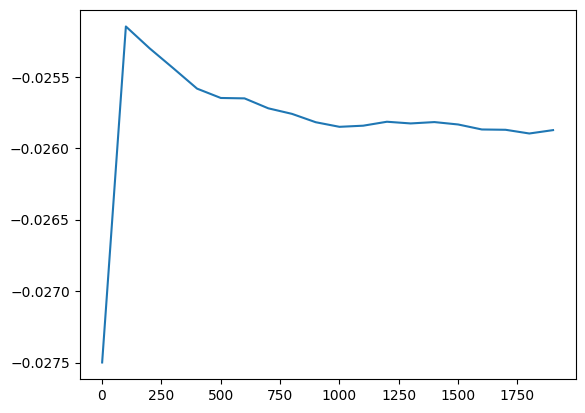

In [81]:
plt.plot(n_range, regr_gs.cv_results_['mean_test_score'])

## Повторение пункта 8 для найденных оптимальных значений гиперпараметров. Сравнение качества полученных моделей с качеством baseline-моделей

In [97]:
regr_models_grid = {'KNN_5' + ' ' * (len('KNN_' + regr_gs_best_params_txt) - len('KNN_5')) :KNeighborsRegressor(n_neighbors=5), 
                    str('KNN_'+regr_gs_best_params_txt):regr_gs.best_estimator_}

In [166]:
for model_name, model in regr_models_grid.items():
    train_model(model_name, model, metric_logger)

KNN_5   	 MAE=0.096, MSE=0.019, R2=0.261
KNN_101 	 MAE=0.125, MSE=0.025, R2=0.028


## Формирование выводов о качестве построенных моделей на основе выбранных метрик.

In [99]:
# Метрики качества модели
regr_metrics = metric_logger.df['metric'].unique()
regr_metrics

array(['MAE', 'MSE', 'R2'], dtype=object)

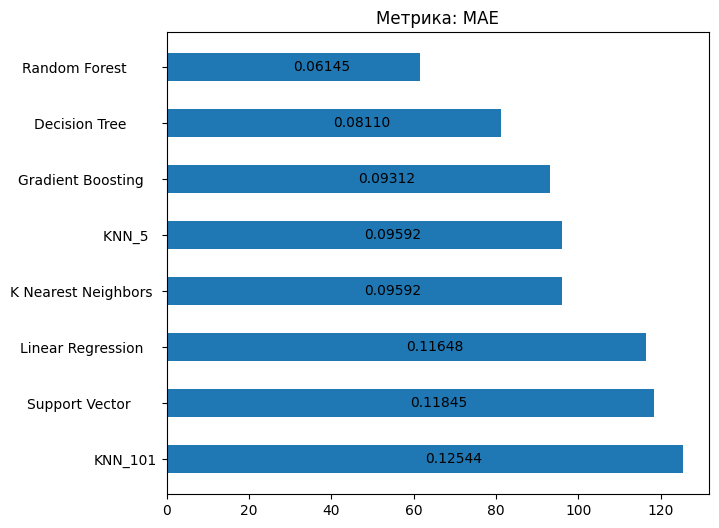

In [171]:
metric_logger.plot('Метрика: ' + 'MAE', 'MAE', ascending=False, figsize=(7, 6))

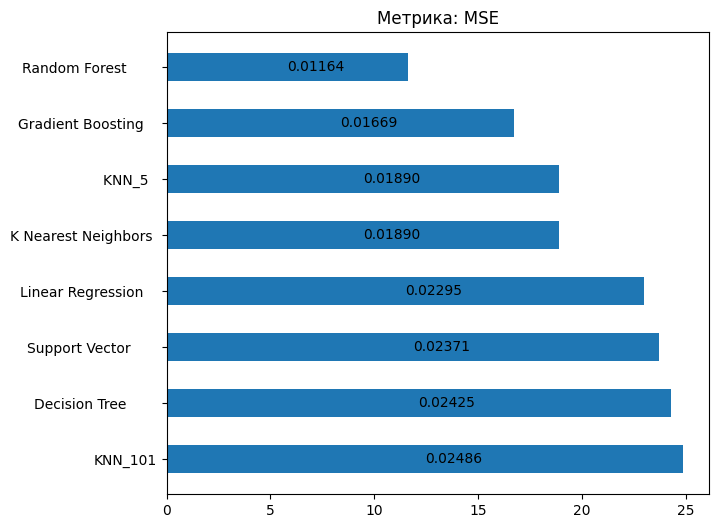

In [170]:
metric_logger.plot('Метрика: ' + 'MSE', 'MSE', ascending=False, figsize=(7, 6))

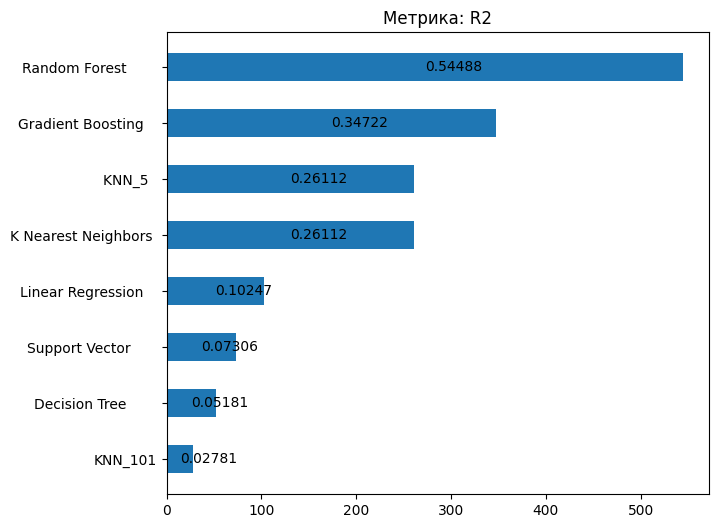

In [169]:
metric_logger.plot('Метрика: ' + 'R2', 'R2', ascending=True, figsize=(7, 6))

**Вывод:** лучшими оказались модели на основе случайного леса и градиентного бустинга. При отдельных запусках вместо градиентного бустинга оказывается лучшей модель решающего дерева.